<a href="https://colab.research.google.com/github/Elnare05/Data-science/blob/main/Kredit_risk_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import files
files.upload()

Saving cs-training.csv.zip to cs-training.csv.zip


{'cs-training.csv.zip': b'PK\x03\x04-\x00\x00\x00\x08\x00\xaf\xad4O\x9f\x92y\xcc\xff\xff\xff\xff\xff\xff\xff\xff\x0f\x00\x14\x00cs-training.csv\x01\x00\x10\x00\xa5ns\x00\x00\x00\x00\x00\xc9\x97*\x00\x00\x00\x00\x00l\xbdY\x0f-Kr\x9d\xf7N\x80\xffd\xf3 \xe7\xe1\xb1a\xea\xc1\x00}h\xd0\x16\xfc\xdc\x12\xaf\xe4\x06\xc8n\xbb\xbb)\x80\xfa\xf5\x8a/\x86\xac\xac}\xc8\x0b\xa9\xef=\xa7rWV\x0e1\xac\x88X\xf1\xf9\xbf~\xfb\xf3\x1f\xfe\xf4o\x7f\xf9\xfb\x7f\xf9\xff\xff\xf0\xc7\xf2\xef\x7f\xfe\xcb\xe7\x9f~\xfb\x1f\x7f\xfa\x97\xff\xf1\x87?\xfe\xf7\xff\xfc\xd7?\xfc\xcb\x1f\xfe\xe7\xef\xff\xfa\x87?\xfd\xf1\x1f\xff\xdb\x7f\xfe\xe3_~\xfb\xaf\xff\xf6\xe7\xdf\xfe\xf9\x1f\xfe\xf0\xc7\xdf\xfe\xf2\xf9\xfd\x7f\xff\xed\xf3\xf3\xdf\xfe\xf5\xbf\xfc\xf6\xe7\x7f\xfco\xff\xf7\x1f\xfe\xf5\xb7\x9a\xfe\xae\xef\xbf\xff\xfd\xbf\xff\xe5\xff\xfc\xfd_\xfe\xfa\xf7\xff\xf6\xdb\xcf?\xfd\xf5\xff\xf9\xd3\x9f\xff\xf2\xdb\xe7\xef\x7f\xfb/\x7f\xfd\'~\xe3\xf3\x7f\xfc\xe9\x8f\x7f\xfd\x7f\xff\xe5\xdf\xff\xf7?\xfe\xd7?\xfd\xeb3\xf8\x1f\xff\xb

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.inspection import permutation_importance
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve, precision_score
from sklearn.metrics import precision_recall_curve


In [17]:
df = pd.read_csv('/content/cs-training.csv.zip')
df

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
149995,149996,0,0.040674,74,0,0.225131,2100.0,4,0,1,0,0.0
149996,149997,0,0.299745,44,0,0.716562,5584.0,4,0,1,0,2.0
149997,149998,0,0.246044,58,0,3870.000000,NaN,18,0,1,0,0.0
149998,149999,0,0.000000,30,0,0.000000,5716.0,4,0,0,0,0.0


In [18]:
df.shape

(150000, 12)

In [19]:
df.head()

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0


In [20]:
df['SeriousDlqin2yrs'].value_counts(normalize=True)

,proportion
SeriousDlqin2yrs,
0,0.93316
1,0.06684


In [21]:
df.isnull().sum()

,0
Unnamed: 0,0
SeriousDlqin2yrs,0
RevolvingUtilizationOfUnsecuredLines,0
age,0
NumberOfTime30-59DaysPastDueNotWorse,0
DebtRatio,0
MonthlyIncome,29731
NumberOfOpenCreditLinesAndLoans,0
NumberOfTimes90DaysLate,0
NumberRealEstateLoansOrLines,0


In [22]:
df = df.drop(columns=['Unnamed: 0'])
df["MonthlyIncome"] = df["MonthlyIncome"].fillna(df["MonthlyIncome"].median())
df["NumberOfDependents"] = df["NumberOfDependents"].fillna(df["NumberOfDependents"].median())
df=df[df['age'] > 0].copy()
df["adjusted_income"] = df["MonthlyIncome"] / (1 + df["NumberOfDependents"])

In [23]:
delinq_cols = [
    "NumberOfTime30-59DaysPastDueNotWorse",
    "NumberOfTimes90DaysLate",
    "NumberOfTime60-89DaysPastDueNotWorse"
]

for col in delinq_cols:
    df[col] = df[col].replace([96, 98], np.nan)
    df[col] = df[col].fillna(df[col].median())

In [24]:
cap_cols = ["RevolvingUtilizationOfUnsecuredLines", "DebtRatio", "MonthlyIncome", "adjusted_income"]

for col in cap_cols:
    upper_cap = df[col].quantile(0.99)
    df[col] = df[col].clip(upper=upper_cap)

In [25]:
features = [
    "RevolvingUtilizationOfUnsecuredLines",
    "age",
    "NumberOfTime30-59DaysPastDueNotWorse",
    "DebtRatio",
    "MonthlyIncome",
    "NumberOfOpenCreditLinesAndLoans",
    "NumberOfTimes90DaysLate",
    "NumberRealEstateLoansOrLines",
    "NumberOfTime60-89DaysPastDueNotWorse",
    "NumberOfDependents",
    "adjusted_income"
]
target = "SeriousDlqin2yrs"

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

sample_weights_train = compute_sample_weight("balanced", y_train)

In [26]:
results = {}


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

log_reg = LogisticRegression(class_weight="balanced", max_iter=1000)
log_reg.fit(X_train_scaled, y_train)
proba_lr = log_reg.predict_proba(X_test_scaled)[:, 1]
results["Logistic Regression"] = roc_auc_score(y_test, proba_lr)


rf_model = RandomForestClassifier(
    n_estimators=300, max_depth=10, min_samples_split=20, min_samples_leaf=10,
    class_weight="balanced", random_state=42, n_jobs=-1
)
rf_model.fit(X_train, y_train)
proba_rf = rf_model.predict_proba(X_test)[:, 1]
results["Random Forest"] = roc_auc_score(y_test, proba_rf)


hgb_model = HistGradientBoostingClassifier(
    max_depth=6, learning_rate=0.05, max_iter=300, l2_regularization=1.0, random_state=42
)
hgb_model.fit(X_train, y_train, sample_weight=sample_weights_train)
proba_hgb = hgb_model.predict_proba(X_test)[:, 1]
results["HistGradientBoosting"] = roc_auc_score(y_test, proba_hgb)

pd.Series(results, name="ROC-AUC").sort_values(ascending=False)

,ROC-AUC
HistGradientBoosting,0.869163
Random Forest,0.865469
Logistic Regression,0.859729


In [27]:
final_model = hgb_model
final_proba = proba_hgb
final_pred_default = (final_proba >= 0.5).astype(int)

print("ROC-AUC:", roc_auc_score(y_test, final_proba))
print("\nConfusion Matrix (threshold=0.5):")
print(confusion_matrix(y_test, final_pred_default))
print("\nClassification Report (threshold=0.5):")
print(classification_report(y_test, final_pred_default))

ROC-AUC: 0.8691631877619757

Confusion Matrix (threshold=0.5):
[[22301  5694]
 [  435  1570]]

Classification Report (threshold=0.5):
              precision    recall  f1-score   support

           0       0.98      0.80      0.88     27995
           1       0.22      0.78      0.34      2005

    accuracy                           0.80     30000
   macro avg       0.60      0.79      0.61     30000
weighted avg       0.93      0.80      0.84     30000



In [31]:
precisions, recalls, thresholds = precision_recall_curve(y_test, final_proba)
f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-9)

best_idx = f1_scores[:-1].argmax()
best_threshold = thresholds[best_idx]

print(f"Optimal threshold: {best_threshold:.3f}")
print(f"Bu threshold-da F1-score: {f1_scores[best_idx]:.3f}")

final_pred_best = (final_proba >= best_threshold).astype(int)

print("\nConfusion Matrix (optimal threshold):")
print(confusion_matrix(y_test, final_pred_best))
print("\nClassification Report (optimal threshold):")
print(classification_report(y_test, final_pred_best))

Optimal threshold: 0.777
Bu threshold-da F1-score: 0.445

Confusion Matrix (optimal threshold):
[[26499  1496]
 [ 1004  1001]]

Classification Report (optimal threshold):
              precision    recall  f1-score   support

           0       0.96      0.95      0.95     27995
           1       0.40      0.50      0.44      2005

    accuracy                           0.92     30000
   macro avg       0.68      0.72      0.70     30000
weighted avg       0.93      0.92      0.92     30000



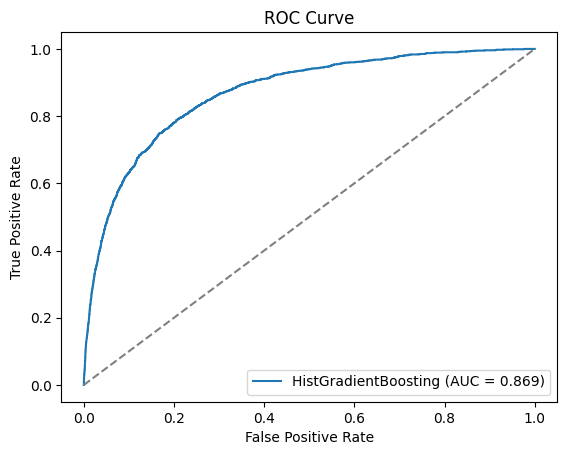

In [32]:
fpr, tpr, _ = roc_curve(y_test, final_proba)

plt.figure()
plt.plot(fpr, tpr, label=f"HistGradientBoosting (AUC = {roc_auc_score(y_test, final_proba):.3f})")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

In [33]:
perm_result = permutation_importance(
    final_model, X_test, y_test, n_repeats=5, random_state=42, scoring="roc_auc", n_jobs=-1
)

importance_df = pd.DataFrame({
    "Feature": features,
    "Importance": perm_result.importances_mean
}).sort_values(by="Importance", ascending=False)

importance_df

,Feature,Importance
0,RevolvingUtilizationOfUnsecuredLines,0.074576
2,NumberOfTime30-59DaysPastDueNotWorse,0.031267
6,NumberOfTimes90DaysLate,0.030304
8,NumberOfTime60-89DaysPastDueNotWorse,0.014787
1,age,0.010431
5,NumberOfOpenCreditLinesAndLoans,0.007000
3,DebtRatio,0.004907
7,NumberRealEstateLoansOrLines,0.001835
4,MonthlyIncome,0.000908
10,adjusted_income,0.000614


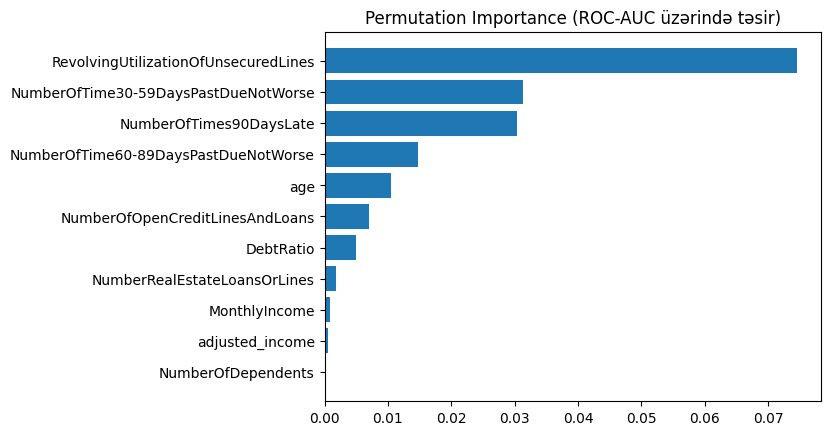

In [34]:
plt.figure()
plt.barh(importance_df["Feature"], importance_df["Importance"])
plt.gca().invert_yaxis()
plt.title("Permutation Importance (ROC-AUC üzərində təsir)")
plt.show()

In [35]:
df_test = X_test.copy()
df_test["true_label"] = y_test.values
df_test["predicted_label"] = final_pred_best
df_test["predicted_probability"] = final_proba

top_risky = df_test.sort_values(by="predicted_probability", ascending=False).head(3)
top_risky

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,adjusted_income,true_label,predicted_label,predicted_probability
11723,1.009463,30,2.0,0.570130,3300.0,11,5.0,0,2.0,4.0,660.0,1,1,0.974341
41214,1.092958,40,6.0,1135.000000,5400.0,7,4.0,0,5.0,0.0,5400.0,1,1,0.973554
22555,1.067231,33,1.0,0.948347,4626.0,18,3.0,1,5.0,0.0,4626.0,1,1,0.973145


In [36]:
def build_case_summary(row):
    return f"""
Borrower profile:
- Age: {row['age']}
- Revolving utilization of unsecured lines: {row['RevolvingUtilizationOfUnsecuredLines']:.3f}
- Debt ratio: {row['DebtRatio']:.3f}
- Monthly income: {row['MonthlyIncome']:.2f}
- Adjusted income: {row['adjusted_income']:.2f}
- Number of open credit lines and loans: {row['NumberOfOpenCreditLinesAndLoans']}
- Number of real estate loans or lines: {row['NumberRealEstateLoansOrLines']}
- Number of dependents: {row['NumberOfDependents']}
- 30-59 days past due count: {row['NumberOfTime30-59DaysPastDueNotWorse']}
- 60-89 days past due count: {row['NumberOfTime60-89DaysPastDueNotWorse']}
- 90 days late count: {row['NumberOfTimes90DaysLate']}
- Predicted label: {row['predicted_label']}
- Predicted probability of default: {row['predicted_probability']:.3f}
"""

for idx, row in top_risky.iterrows():
    print("=" * 80)
    print(f"BORROWER INDEX: {idx}")
    print(build_case_summary(row))

BORROWER INDEX: 11723

Borrower profile:
- Age: 30.0
- Revolving utilization of unsecured lines: 1.009
- Debt ratio: 0.570
- Monthly income: 3300.00
- Adjusted income: 660.00
- Number of open credit lines and loans: 11.0
- Number of real estate loans or lines: 0.0
- Number of dependents: 4.0
- 30-59 days past due count: 2.0
- 60-89 days past due count: 2.0
- 90 days late count: 5.0
- Predicted label: 1.0
- Predicted probability of default: 0.974

BORROWER INDEX: 41214

Borrower profile:
- Age: 40.0
- Revolving utilization of unsecured lines: 1.093
- Debt ratio: 1135.000
- Monthly income: 5400.00
- Adjusted income: 5400.00
- Number of open credit lines and loans: 7.0
- Number of real estate loans or lines: 0.0
- Number of dependents: 0.0
- 30-59 days past due count: 6.0
- 60-89 days past due count: 5.0
- 90 days late count: 4.0
- Predicted label: 1.0
- Predicted probability of default: 0.974

BORROWER INDEX: 22555

Borrower profile:
- Age: 33.0
- Revolving utilization of unsecured lines